In [1]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
import warnings
warnings.filterwarnings('ignore')


In [2]:
df= pd.read_csv("C:\\Users\\hp\\Desktop\\New folder\\Credit Score.csv")

In [3]:
df.shape

(100000, 28)

In [4]:
df.head()

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,5634,3392,1,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,26.822620,265.0,No,49.574949,21.46538,High_spent_Small_value_payments,312.494089,Good
1,5635,3392,2,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,31.944960,266.0,No,49.574949,21.46538,Low_spent_Large_value_payments,284.629162,Good
2,5636,3392,3,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,28.609352,267.0,No,49.574949,21.46538,Low_spent_Medium_value_payments,331.209863,Good
3,5637,3392,4,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,31.377862,268.0,No,49.574949,21.46538,Low_spent_Small_value_payments,223.451310,Good
4,5638,3392,5,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,24.797347,269.0,No,49.574949,21.46538,High_spent_Medium_value_payments,341.489231,Good


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  int64  
 1   Customer_ID               100000 non-null  int64  
 2   Month                     100000 non-null  int64  
 3   Name                      100000 non-null  object 
 4   Age                       100000 non-null  float64
 5   SSN                       100000 non-null  float64
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  float64
 8   Monthly_Inhand_Salary     100000 non-null  float64
 9   Num_Bank_Accounts         100000 non-null  float64
 10  Num_Credit_Card           100000 non-null  float64
 11  Interest_Rate             100000 non-null  float64
 12  Num_of_Loan               100000 non-null  float64
 13  Type_of_Loan              100000 non-null  ob

In [6]:
df.nunique().sort_values(ascending=True)

Credit_Score                     3
Payment_of_Min_Amount            3
Credit_Mix                       3
Payment_Behaviour                6
Month                            8
Num_of_Loan                     10
Num_Bank_Accounts               12
Num_Credit_Card                 12
Occupation                      15
Num_Credit_Inquiries            18
Num_of_Delayed_Payment          26
Interest_Rate                   34
Age                             43
Delay_from_due_date             63
Credit_History_Age             404
Changed_Credit_Limit          3452
Type_of_Loan                  6261
Name                         10128
Total_EMI_per_month          11890
Outstanding_Debt             12203
Amount_invested_monthly      12261
Annual_Income                12488
SSN                          12500
Customer_ID                  12500
Monthly_Inhand_Salary        13241
Monthly_Balance              98494
Credit_Utilization_Ratio    100000
ID                          100000
dtype: int64

In [7]:
df.describe()

,ID,Customer_ID,Month,Age,SSN,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,...,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,100000.000000,100000.000000,100000.000000,100000.000000,1.000000e+05,100000.000000,100000.000000,100000.000000,100000.000000,100000.00000,...,100000.00000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,80631.500000,25982.666640,4.500000,33.316340,5.004617e+08,50505.123449,4197.270835,5.368820,5.533570,14.53208,...,21.08141,13.313120,10.470323,5.798250,1426.220376,32.285173,221.220460,107.699208,55.101315,392.697586
std,43301.486619,14340.543051,2.291299,10.764812,2.908267e+08,38299.422093,3186.432497,2.593314,2.067098,8.74133,...,14.80456,6.237166,6.609481,3.867826,1155.129026,5.116875,99.680716,132.267056,39.006932,201.652719
min,5634.000000,1006.000000,1.000000,14.000000,8.134900e+04,7005.930000,303.645417,0.000000,0.000000,1.00000,...,0.00000,0.000000,0.500000,0.000000,0.230000,20.000000,1.000000,0.000000,0.000000,0.007760
25%,43132.750000,13664.500000,2.750000,24.000000,2.451686e+08,19342.972500,1626.594167,3.000000,4.000000,7.00000,...,10.00000,9.000000,5.380000,3.000000,566.072500,28.052567,144.000000,29.268886,27.959111,267.615983
50%,80631.500000,25777.000000,4.500000,33.000000,5.006886e+08,36999.705000,3095.905000,5.000000,5.000000,13.00000,...,18.00000,14.000000,9.400000,5.000000,1166.155000,32.305784,219.000000,66.462304,45.156550,333.865366
75%,118130.250000,38385.000000,6.250000,42.000000,7.560027e+08,71683.470000,5957.715000,7.000000,7.000000,20.00000,...,28.00000,18.000000,14.850000,8.000000,1945.962500,36.496663,302.000000,147.392573,71.295797,463.215683
max,155629.000000,50999.000000,8.000000,56.000000,9.999934e+08,179987.280000,15204.633333,11.000000,11.000000,34.00000,...,62.00000,25.000000,29.980000,17.000000,4998.070000,50.000000,404.000000,1779.103254,434.191089,1183.930696


In [8]:
df.isnull().sum()

ID                          0
Customer_ID                 0
Month                       0
Name                        0
Age                         0
SSN                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Type_of_Loan                0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Credit_Score                0
dtype: int64

In [9]:
df.drop(['ID'],axis=1,inplace=True)

In [10]:
df.drop(['Customer_ID'],axis=1,inplace=True)

In [11]:
df.drop(['Name'],axis=1,inplace=True)

In [12]:
df.drop(['SSN'],axis=1,inplace=True)

In [13]:
df.drop(['Type_of_Loan'],axis=1,inplace=True)

In [14]:
df.isnull().sum()

Month                       0
Age                         0
Occupation                  0
Annual_Income               0
Monthly_Inhand_Salary       0
Num_Bank_Accounts           0
Num_Credit_Card             0
Interest_Rate               0
Num_of_Loan                 0
Delay_from_due_date         0
Num_of_Delayed_Payment      0
Changed_Credit_Limit        0
Num_Credit_Inquiries        0
Credit_Mix                  0
Outstanding_Debt            0
Credit_Utilization_Ratio    0
Credit_History_Age          0
Payment_of_Min_Amount       0
Total_EMI_per_month         0
Amount_invested_monthly     0
Payment_Behaviour           0
Monthly_Balance             0
Credit_Score                0
dtype: int64

# Target variable - Credit_Score
After using LabelEncoder values of Credit_Score changed into:-
Standard-2,
Poor-1,
Good -0

In [15]:
df.Credit_Score.value_counts()

Standard    53174
Poor        28998
Good        17828
Name: Credit_Score, dtype: int64

In [16]:
df.Credit_Score=df.Credit_Score.map({'Good':0,'Standard':1,'Poor':2})

In [17]:
df.Credit_Score.value_counts()

1    53174
2    28998
0    17828
Name: Credit_Score, dtype: int64

<AxesSubplot:xlabel='Credit_Score', ylabel='count'>

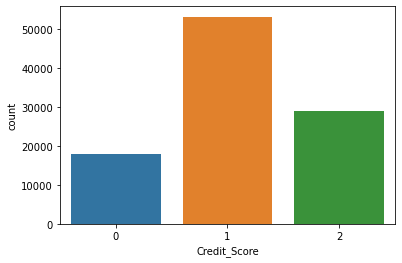

In [18]:
sns.countplot(df.Credit_Score)

# Month

In [19]:
df.Month.value_counts()

1    12500
2    12500
3    12500
4    12500
5    12500
6    12500
7    12500
8    12500
Name: Month, dtype: int64

Text(0.5, 1.0, 'Barplot of Gender')

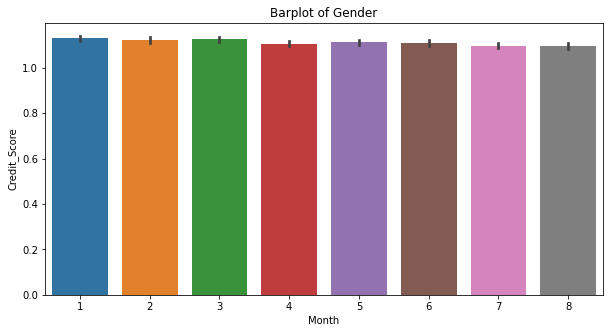

In [20]:
plt.figure(figsize=(10,5))
sns.barplot(data=df,x='Month',y='Credit_Score')
plt.title('Barplot of Gender')

In [21]:
df.drop(['Month'],axis=1,inplace=True)

# Age

In [22]:
len(df.Age.unique())

43

[Text(0.5, 0, '')]

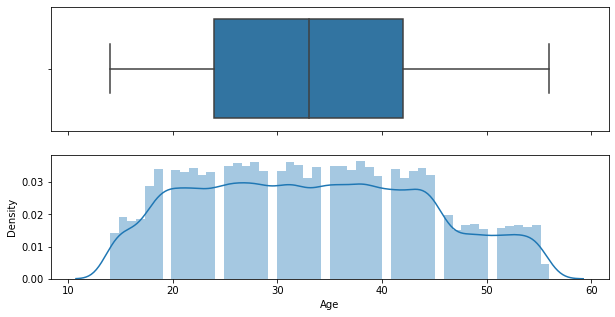

In [23]:
fig,(ax1,ax2)=plt.subplots(2,sharex=True,figsize=(10,5))
sns.boxplot(df.Age,ax=ax1)
sns.distplot(df.Age,ax=ax2)
ax1.set(xlabel='')

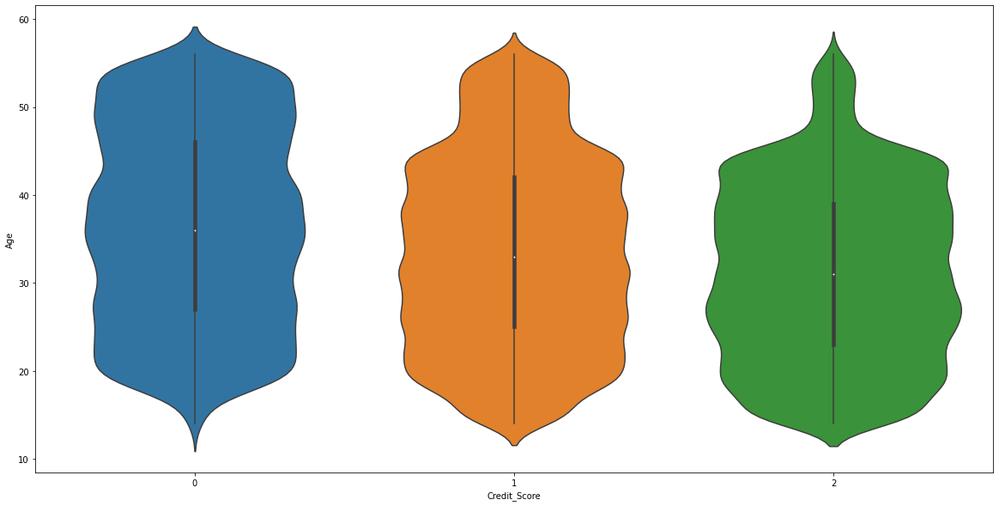

In [24]:
plt.figure(figsize=(20,10))
sns.violinplot(y="Age", x="Credit_Score", data=df)
plt.show()

In [25]:

#fig1, ax1 = plt.subplots()
#ax1.pie(df['Credit_Score'], labels=df['Age'], autopct='%1.1f%%', startangle=90)

In [26]:
#ax1.set_title("Credit Score Distribution by Age")
#ax1.axis('equal')
#plt.show()

# Occupation

In [27]:
df.Occupation.value_counts()

Lawyer           7096
Engineer         6864
Architect        6824
Mechanic         6776
Scientist        6744
Accountant       6744
Developer        6720
Media_Manager    6720
Teacher          6672
Entrepreneur     6648
Doctor           6568
Journalist       6536
Manager          6432
Musician         6352
Writer           6304
Name: Occupation, dtype: int64

In [28]:
df.drop(['Occupation'],axis=1,inplace=True)

# Annual_Income

In [29]:
df.Annual_Income.value_counts()

20867.670    16
9141.630     16
32543.380    16
40341.160    16
22434.160    16
             ..
18317.260     8
14784.450     8
60573.960     8
18413.795     8
39628.990     8
Name: Annual_Income, Length: 12488, dtype: int64

[Text(0.5, 0, '')]

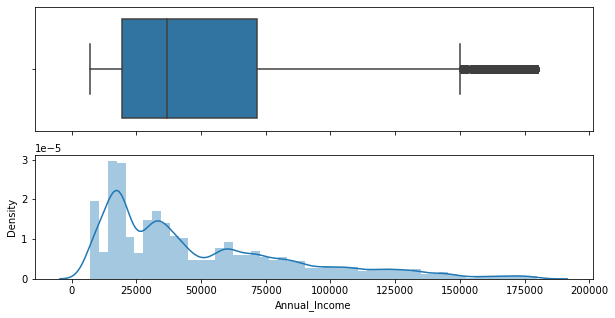

In [30]:
fig,(ax1,ax2)=plt.subplots(2,sharex=True,figsize=(10,5))
sns.boxplot(df.Annual_Income,ax=ax1)
sns.distplot(df.Annual_Income,ax=ax2)
ax1.set(xlabel='')

In [31]:
def remove_outliers(data):
    q1,q3=np.percentile(data,[25,75])
    iqr=q3-q1
    lb=q1-(1.5*iqr)
    ub=q3+(1.5*iqr)
    return[x for x in data if x>=lb and x<=ub]

In [32]:
df=df[df['Annual_Income'].isin(remove_outliers(df['Annual_Income']))]

Text(0.5, 1.0, 'Boxplot of Annual_Income')

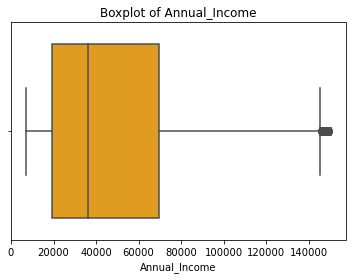

In [33]:
sns.boxplot(df.Annual_Income, color = 'orange')
plt.title('Boxplot of Annual_Income')

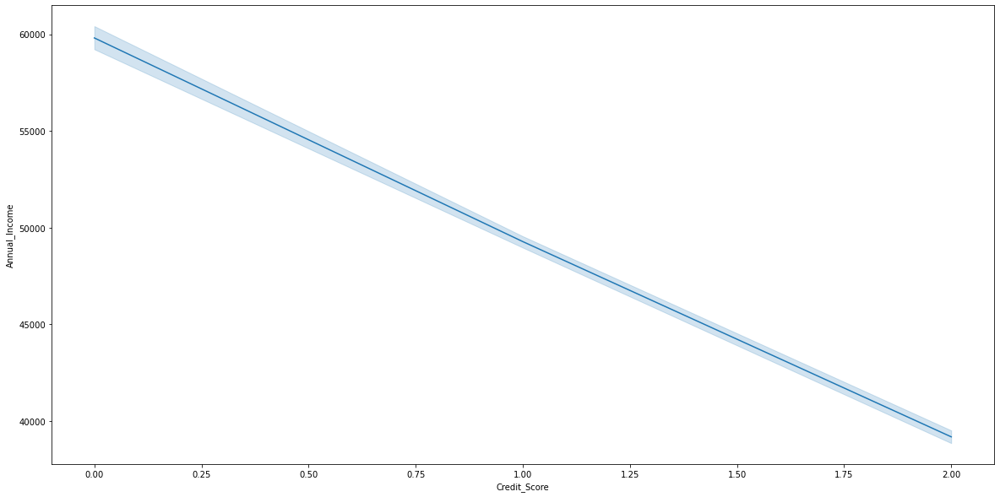

In [34]:
plt.figure(figsize=(20,10))
sns.lineplot(y="Annual_Income", x="Credit_Score", data=df)
plt.show()

# Monthly_Inhand_Salary

In [35]:
df.Monthly_Inhand_Salary.value_counts()

2295.058333    16
1315.560833    16
3080.555000    16
4387.272500    16
6358.956667    16
               ..
1242.927083     1
3925.859167     1
1171.566907     1
1201.145719     1
1465.163134     1
Name: Monthly_Inhand_Salary, Length: 12977, dtype: int64

[Text(0.5, 0, '')]

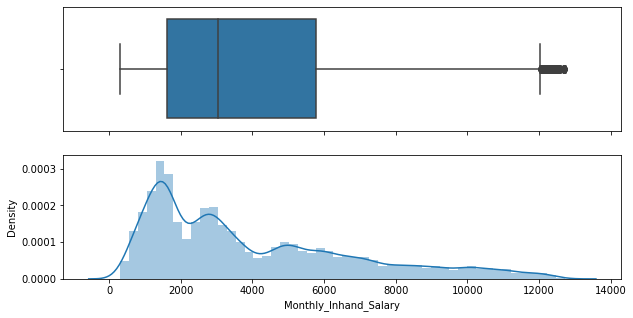

In [36]:
fig,(ax1,ax2)=plt.subplots(2,sharex=True,figsize=(10,5))
sns.boxplot(df.Monthly_Inhand_Salary,ax=ax1)
sns.distplot(df.Monthly_Inhand_Salary,ax=ax2)
ax1.set(xlabel='')

In [37]:
df=df[df['Monthly_Inhand_Salary'].isin(remove_outliers(df['Monthly_Inhand_Salary']))]

Text(0.5, 1.0, 'Boxplot of Monthly_Inhand_Salary')

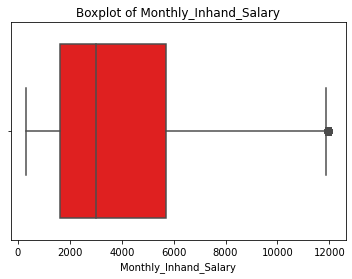

In [38]:
sns.boxplot(df.Monthly_Inhand_Salary, color = 'red')
plt.title('Boxplot of Monthly_Inhand_Salary')

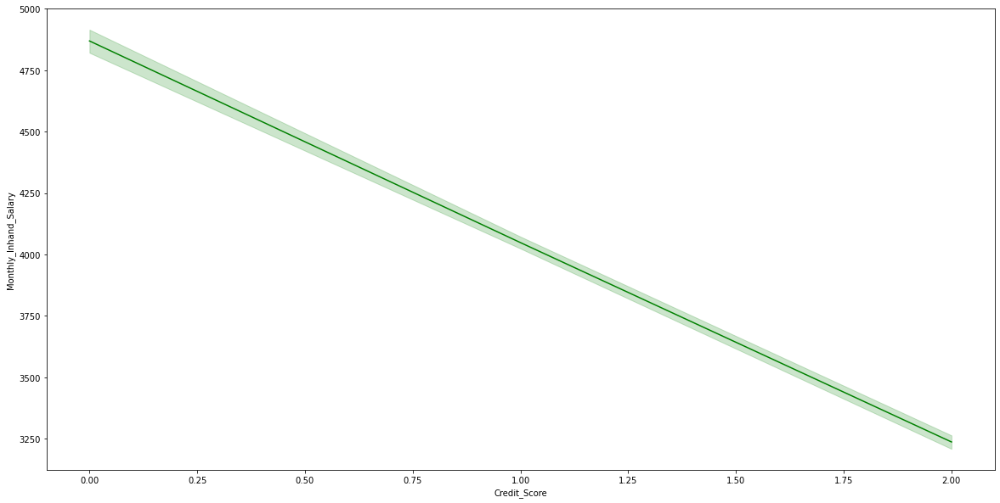

In [39]:
plt.figure(figsize=(20,10))
sns.lineplot(y="Monthly_Inhand_Salary", x="Credit_Score", color="green", data=df)
plt.show()

# Num_Bank_Accounts

In [40]:
df.Num_Bank_Accounts.value_counts()

6.0     13137
7.0     12967
8.0     12899
4.0     11923
5.0     11800
3.0     11694
9.0      5503
10.0     5329
1.0      4142
0.0      4126
2.0      3883
11.0        9
Name: Num_Bank_Accounts, dtype: int64

<AxesSubplot:xlabel='Num_Bank_Accounts', ylabel='Credit_Score'>

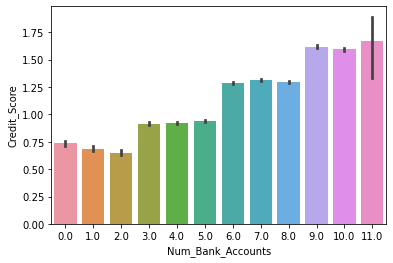

In [41]:

sns.barplot(data=df,x='Num_Bank_Accounts',y='Credit_Score')


In [42]:
anv_mdl =ols('Credit_Score ~ Num_Bank_Accounts',data=df).fit()
anv_tbl = sm.stats.anova_lm(anv_mdl)
print(round(anv_tbl,5))

                        df       sum_sq     mean_sq            F  PR(>F)
Num_Bank_Accounts      1.0   6615.41914  6615.41914  17290.22459     0.0
Residual           97410.0  37270.07566     0.38261          NaN     NaN


# Num_Credit_Card

In [43]:
df.Num_Credit_Card.value_counts()

5.0     18318
7.0     16657
6.0     16595
4.0     13891
3.0     13051
8.0      5073
10.0     4962
9.0      4753
2.0      2044
1.0      2018
11.0       36
0.0        14
Name: Num_Credit_Card, dtype: int64

<AxesSubplot:xlabel='Num_Credit_Card', ylabel='Credit_Score'>

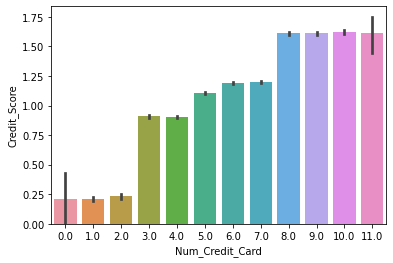

In [44]:
sns.barplot(data=df,x='Num_Credit_Card',y='Credit_Score')


In [45]:
anv_mdl =ols('Credit_Score ~ Num_Credit_Card',data=df).fit()
anv_tbl = sm.stats.anova_lm(anv_mdl)
anv_tbl

,df,sum_sq,mean_sq,F,PR(>F)
Num_Credit_Card,1.0,7130.348359,7130.348359,18897.142326,0.0
Residual,97410.0,36755.146447,0.377324,NaN,NaN


# Interest_Rate

In [46]:
df.Interest_Rate.value_counts()

8.0     4904
5.0     4896
6.0     4607
12.0    4432
9.0     4432
7.0     4416
10.0    4368
11.0    4235
18.0    4176
15.0    4064
20.0    3992
17.0    3872
16.0    3779
19.0    3696
3.0     2605
1.0     2520
4.0     2481
13.0    2424
2.0     2321
14.0    2256
32.0    1776
22.0    1752
24.0    1736
30.0    1728
23.0    1720
29.0    1696
28.0    1648
27.0    1640
25.0    1608
21.0    1592
34.0    1528
26.0    1528
33.0    1496
31.0    1488
Name: Interest_Rate, dtype: int64

[Text(0.5, 0, '')]

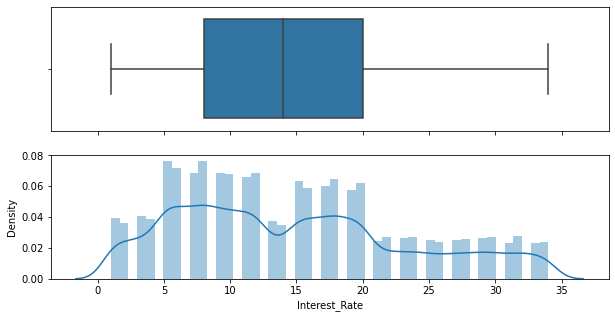

In [47]:
fig,(ax1,ax2)=plt.subplots(2,sharex=True,figsize=(10,5))
sns.boxplot(df.Interest_Rate,ax=ax1)
sns.distplot(df.Interest_Rate,ax=ax2)
ax1.set(xlabel='')

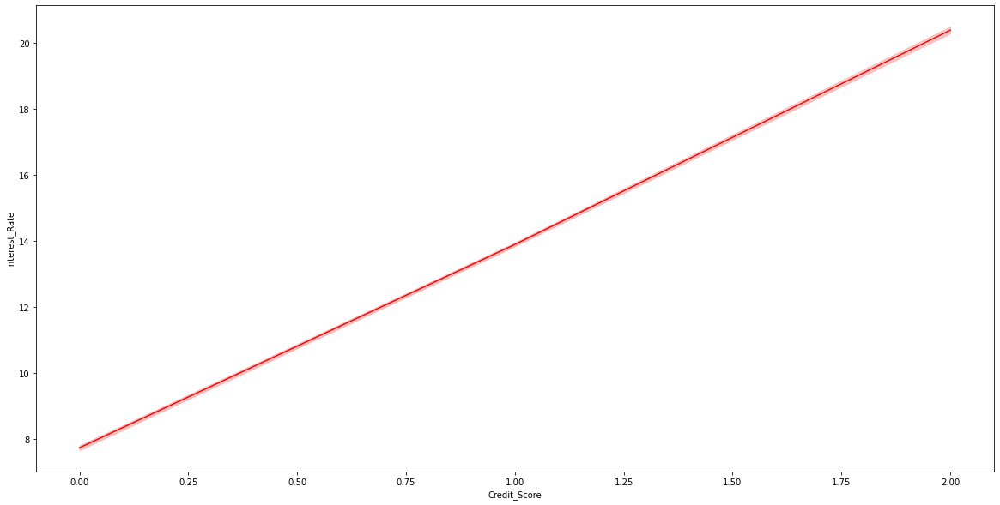

In [48]:
plt.figure(figsize=(20,10))
sns.lineplot(y="Interest_Rate", x="Credit_Score", color="red", data=df)
plt.show()

# Num_of_Loan

In [49]:
df.Num_of_Loan.value_counts()

3.0    15219
2.0    15200
4.0    15008
0.0    10901
1.0    10556
6.0     8144
7.0     7672
5.0     7520
9.0     3856
8.0     3336
Name: Num_of_Loan, dtype: int64

<AxesSubplot:xlabel='Num_of_Loan', ylabel='count'>

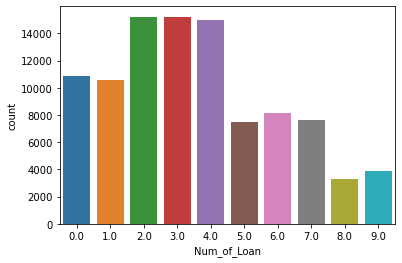

In [50]:
sns.countplot(df.Num_of_Loan)

In [51]:
anv_mdl =ols('Credit_Score ~ Num_of_Loan',data=df).fit()
anv_tbl = sm.stats.anova_lm(anv_mdl)
print(round(anv_tbl,5))

                  df       sum_sq     mean_sq            F  PR(>F)
Num_of_Loan      1.0   5658.25484  5658.25484  14418.26835     0.0
Residual     97410.0  38227.23996     0.39244          NaN     NaN


# Delay_from_due_date

In [52]:
df.Delay_from_due_date.value_counts()

15.0    3464
13.0    3295
14.0    3191
8.0     3165
9.0     3128
        ... 
59.0     528
39.0     525
43.0     502
46.0     490
37.0     490
Name: Delay_from_due_date, Length: 63, dtype: int64

[Text(0.5, 0, '')]

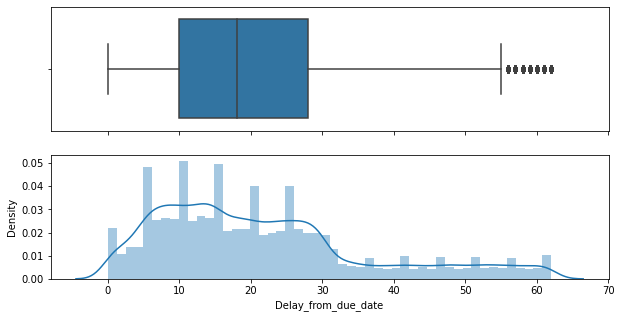

In [53]:
fig,(ax1,ax2)=plt.subplots(2,sharex=True,figsize=(10,5))
sns.boxplot(df.Delay_from_due_date,ax=ax1)
sns.distplot(df.Delay_from_due_date,ax=ax2)
ax1.set(xlabel='')

In [54]:
df=df[df['Delay_from_due_date'].isin(remove_outliers(df['Delay_from_due_date']))]

Text(0.5, 1.0, 'Boxplot of Delay_from_due_date')

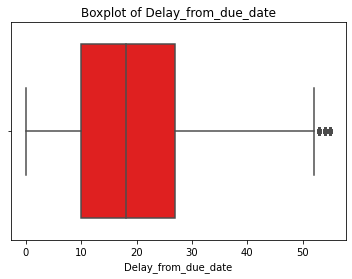

In [55]:
sns.boxplot(df.Delay_from_due_date, color = 'red')
plt.title('Boxplot of Delay_from_due_date')

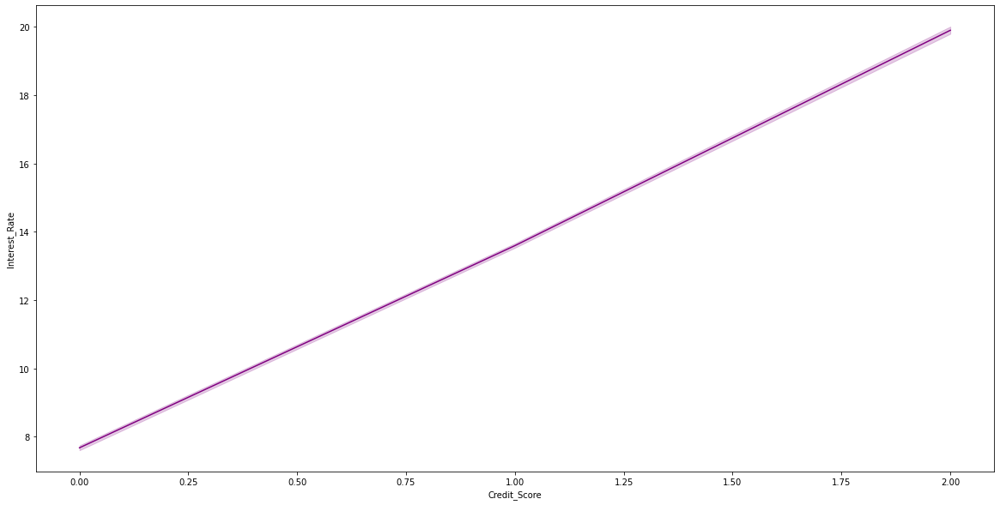

In [56]:
plt.figure(figsize=(20,10))
sns.lineplot(y="Interest_Rate", x="Credit_Score", color="Purple", data=df)
plt.show()

# Num_of_Delayed_Payment

In [57]:
df.Num_of_Delayed_Payment.value_counts()

10.0    5601
19.0    5597
17.0    5459
16.0    5411
15.0    5361
12.0    5279
18.0    5275
20.0    5207
9.0     5198
11.0    5104
8.0     5069
14.0    4363
13.0    4214
21.0    2361
7.0     2338
6.0     2272
22.0    2216
5.0     2072
23.0    2014
0.0     1922
25.0    1912
3.0     1896
2.0     1875
1.0     1846
4.0     1793
24.0    1755
Name: Num_of_Delayed_Payment, dtype: int64

[Text(0.5, 0, '')]

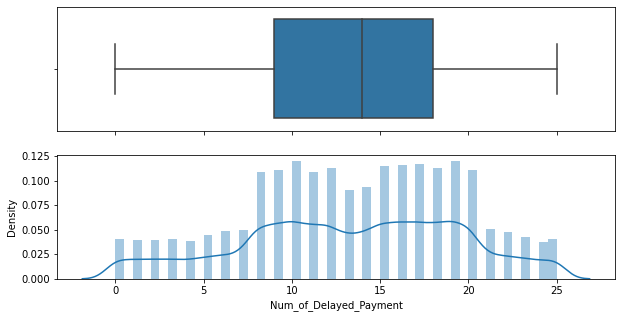

In [58]:
fig,(ax1,ax2)=plt.subplots(2,sharex=True,figsize=(10,5))
sns.boxplot(df.Num_of_Delayed_Payment,ax=ax1)
sns.distplot(df.Num_of_Delayed_Payment,ax=ax2)
ax1.set(xlabel='')

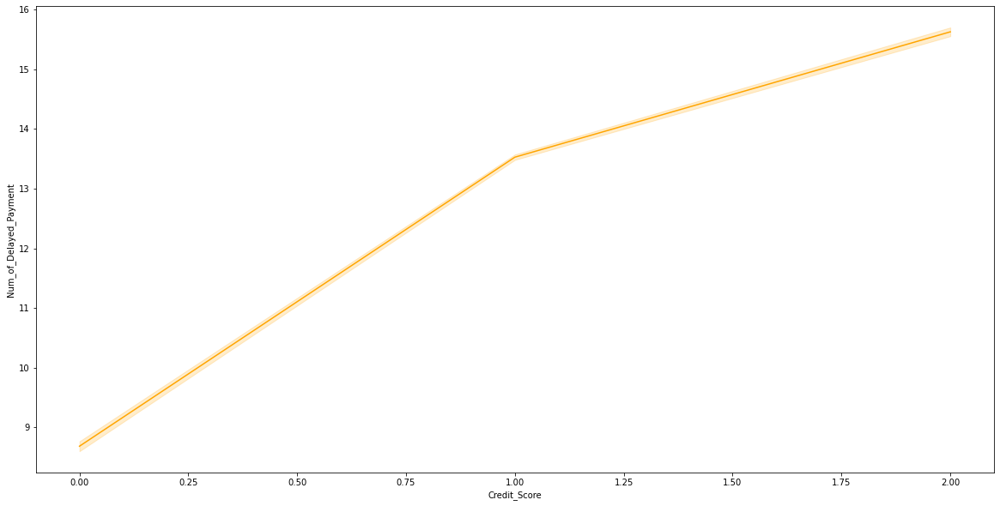

In [59]:
plt.figure(figsize=(20,10))
sns.lineplot(y="Num_of_Delayed_Payment", x="Credit_Score", color="orange", data=df)
plt.show()

# Changed_Credit_Limit

In [60]:
df.Changed_Credit_Limit.value_counts()

8.22     137
10.06    122
11.32    119
7.35     117
3.93     113
        ... 
27.48      1
0.90       1
8.94       1
4.45       1
21.17      1
Name: Changed_Credit_Limit, Length: 3430, dtype: int64

[Text(0.5, 0, '')]

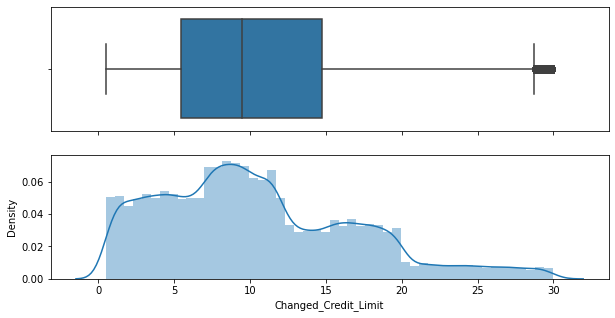

In [61]:
fig,(ax1,ax2)=plt.subplots(2,sharex=True,figsize=(10,5))
sns.boxplot(df.Changed_Credit_Limit,ax=ax1)
sns.distplot(df.Changed_Credit_Limit,ax=ax2)
ax1.set(xlabel='')

In [62]:
df=df[df['Changed_Credit_Limit'].isin(remove_outliers(df['Changed_Credit_Limit']))]

Text(0.5, 1.0, 'Boxplot of Changed_Credit_Limit')

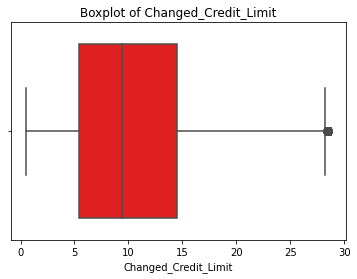

In [63]:
sns.boxplot(df.Changed_Credit_Limit, color = 'red')
plt.title('Boxplot of Changed_Credit_Limit')

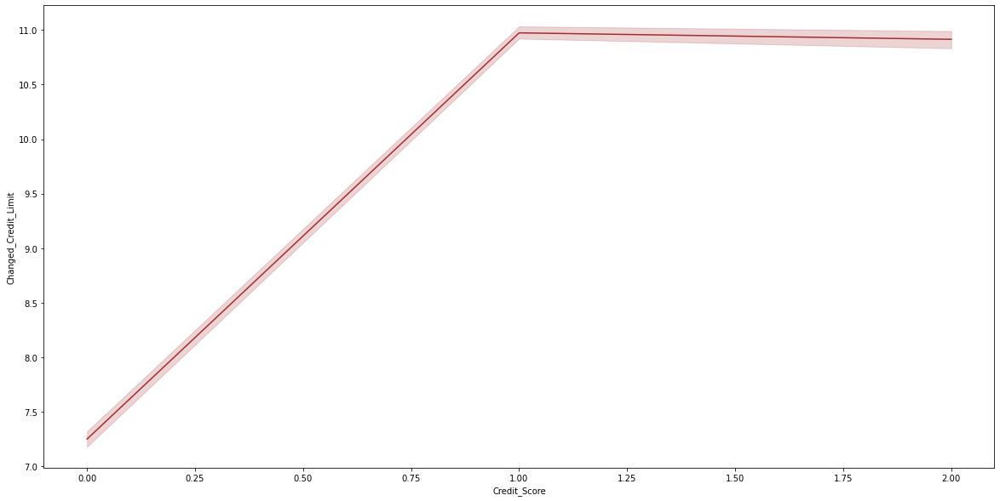

In [64]:
plt.figure(figsize=(20,10))
sns.lineplot(y="Changed_Credit_Limit", x="Credit_Score", color="Brown", data=df)
plt.show()

# Num_Credit_Inquiries

In [65]:
df.Num_Credit_Inquiries.value_counts()

4.0     11229
3.0      8680
2.0      7985
6.0      7809
7.0      7765
8.0      7512
1.0      7368
0.0      6853
5.0      5802
9.0      4934
11.0     4531
10.0     4509
12.0     3990
13.0     1337
14.0      939
15.0      717
16.0      382
17.0      260
Name: Num_Credit_Inquiries, dtype: int64

[Text(0.5, 0, '')]

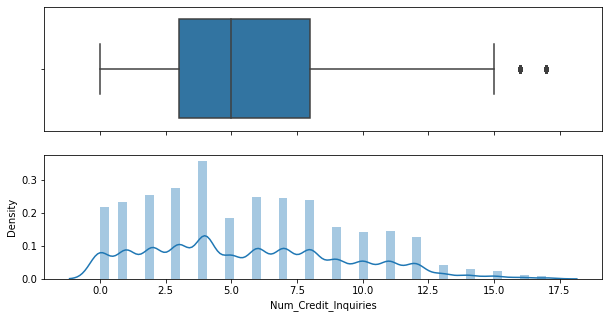

In [66]:
fig,(ax1,ax2)=plt.subplots(2,sharex=True,figsize=(10,5))
sns.boxplot(df.Num_Credit_Inquiries,ax=ax1)
sns.distplot(df.Num_Credit_Inquiries,ax=ax2)
ax1.set(xlabel='')

In [67]:
df=df[df['Num_Credit_Inquiries'].isin(remove_outliers(df['Num_Credit_Inquiries']))]

Text(0.5, 1.0, 'Boxplot of Num_Credit_Inquiries')

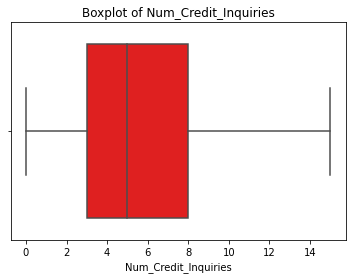

In [68]:
sns.boxplot(df.Num_Credit_Inquiries, color = 'red')
plt.title('Boxplot of Num_Credit_Inquiries')

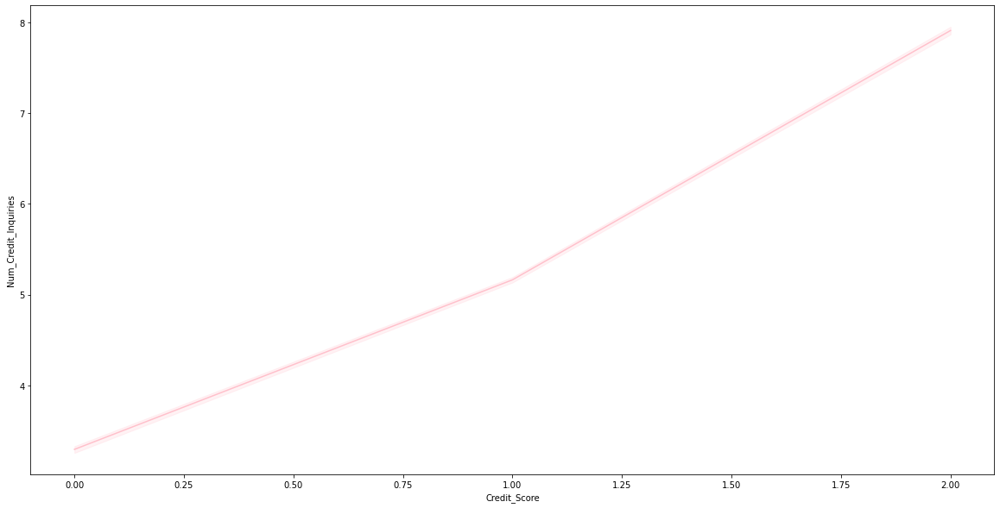

In [69]:
plt.figure(figsize=(20,10))
sns.lineplot(y="Num_Credit_Inquiries", x="Credit_Score", color="Pink", data=df)
plt.show()

# Credit_Mix

In [70]:
df.Credit_Mix.value_counts()

Standard    44945
Good        28026
Bad         18989
Name: Credit_Mix, dtype: int64

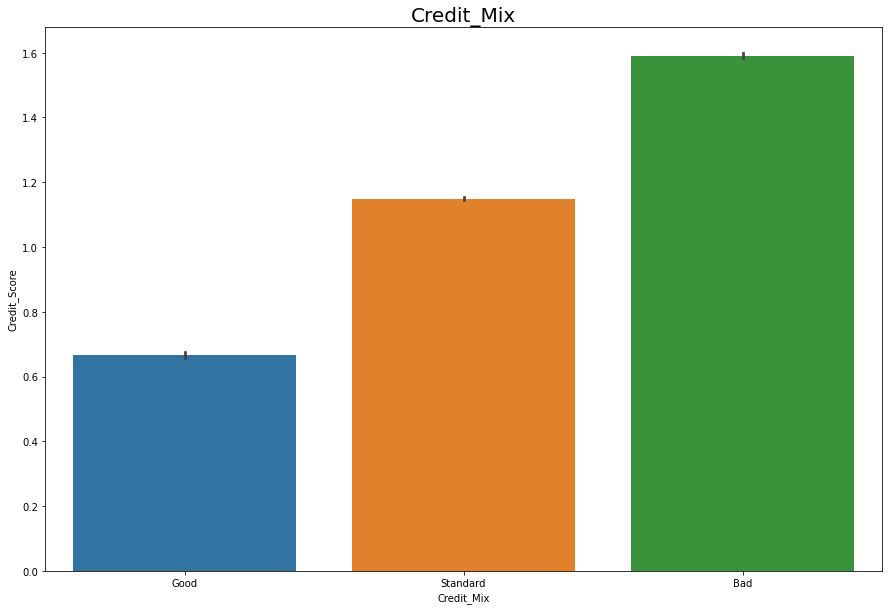

In [71]:
plt.figure(figsize=(15,10))
sns.barplot(x="Credit_Mix", y="Credit_Score", data=df)
plt.title("Credit_Mix", fontsize=20)
plt.show()

In [72]:
anv_mdl =ols('Credit_Score ~ Credit_Mix',data=df).fit()
anv_tbl = sm.stats.anova_lm(anv_mdl)
print(round(anv_tbl,5))

                 df       sum_sq     mean_sq            F  PR(>F)
Credit_Mix      2.0   9916.75095  4958.37547  14612.38289     0.0
Residual    91957.0  31203.48933     0.33933          NaN     NaN


# Outstanding_Debt

In [73]:
df.Outstanding_Debt.value_counts()

460.46     24
1151.70    24
1272.77    16
852.74     16
1286.07    16
           ..
2381.42     1
4300.74     1
3155.47     1
1556.58     1
2753.45     1
Name: Outstanding_Debt, Length: 11524, dtype: int64

[Text(0.5, 0, '')]

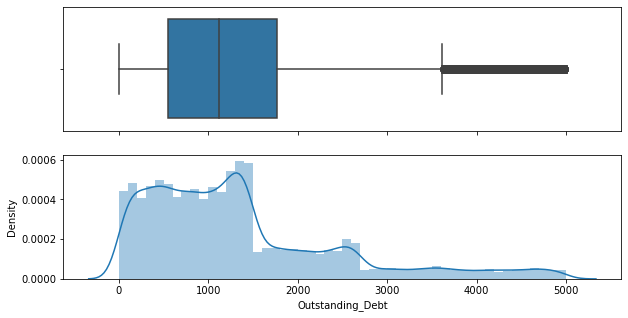

In [74]:
fig,(ax1,ax2)=plt.subplots(2,sharex=True,figsize=(10,5))
sns.boxplot(df.Outstanding_Debt,ax=ax1)
sns.distplot(df.Outstanding_Debt,ax=ax2)
ax1.set(xlabel='')

In [75]:
df=df[df['Outstanding_Debt'].isin(remove_outliers(df['Outstanding_Debt']))]

Text(0.5, 1.0, 'Boxplot of Outstanding_Debt')

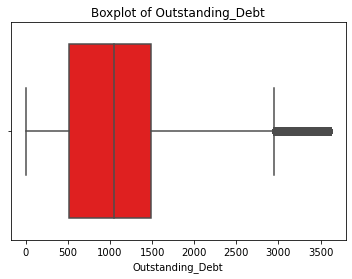

In [76]:
sns.boxplot(df.Outstanding_Debt, color = 'red')
plt.title('Boxplot of Outstanding_Debt')

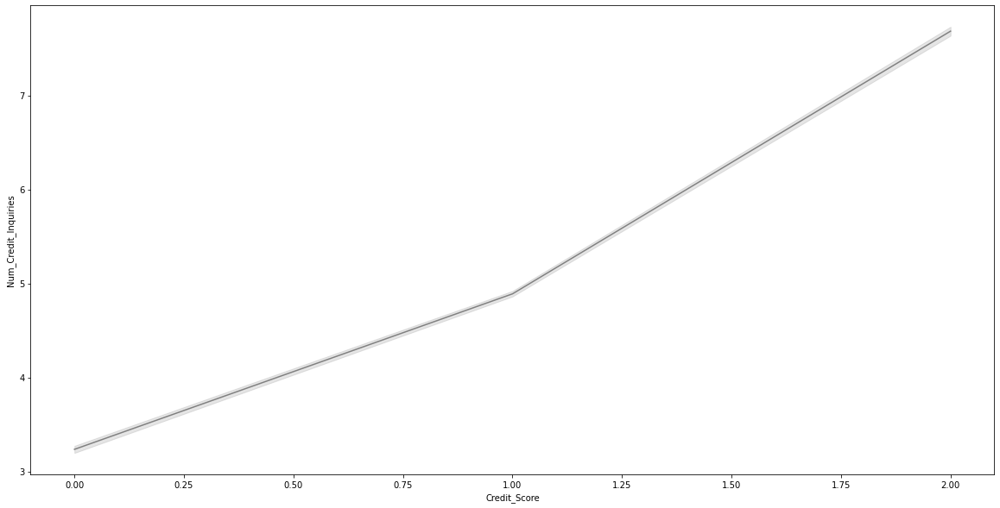

In [77]:
plt.figure(figsize=(20,10))
sns.lineplot(y="Num_Credit_Inquiries", x="Credit_Score", color="Gray", data=df)
plt.show()

# Credit_Utilization_Ratio

In [78]:
df.Credit_Utilization_Ratio.value_counts()

26.822620    1
36.796999    1
26.250681    1
38.482991    1
35.368856    1
            ..
25.849762    1
39.367321    1
32.099208    1
26.889199    1
34.192463    1
Name: Credit_Utilization_Ratio, Length: 86150, dtype: int64

[Text(0.5, 0, '')]

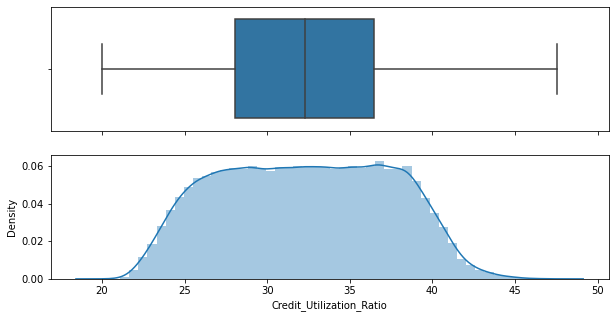

In [79]:
fig,(ax1,ax2)=plt.subplots(2,sharex=True,figsize=(10,5))
sns.boxplot(df.Credit_Utilization_Ratio,ax=ax1)
sns.distplot(df.Credit_Utilization_Ratio,ax=ax2)
ax1.set(xlabel='')

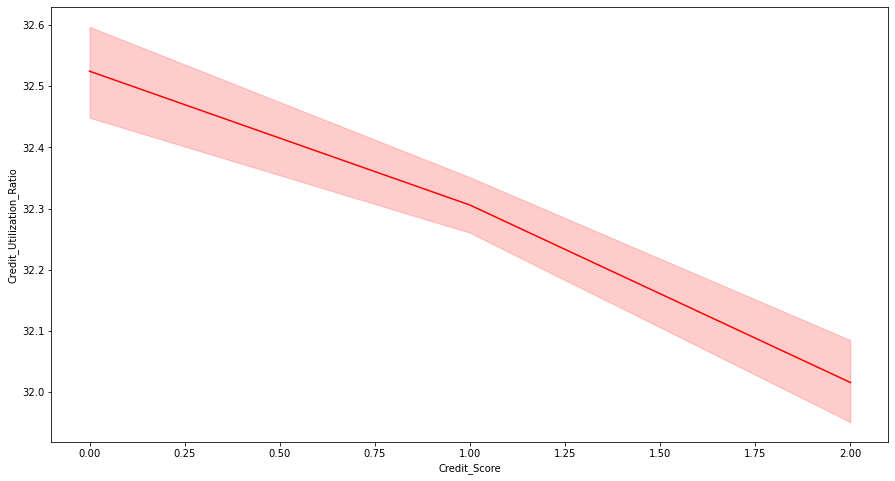

In [80]:
plt.figure(figsize=(15,8))
sns.lineplot(y="Credit_Utilization_Ratio", x="Credit_Score", color="red", data=df)
plt.show()

# Credit_History_Age

In [81]:
df.Credit_History_Age.value_counts()

232.0    460
190.0    460
233.0    458
213.0    456
215.0    454
        ... 
403.0     15
4.0       13
3.0        9
2.0        7
1.0        2
Name: Credit_History_Age, Length: 404, dtype: int64

[Text(0.5, 0, '')]

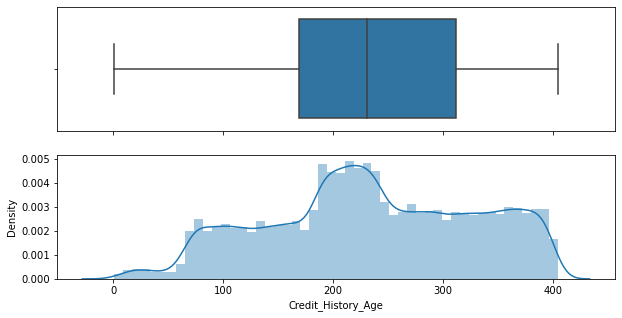

In [82]:
fig,(ax1,ax2)=plt.subplots(2,sharex=True,figsize=(10,5))
sns.boxplot(df.Credit_History_Age,ax=ax1)
sns.distplot(df.Credit_History_Age,ax=ax2)
ax1.set(xlabel='')

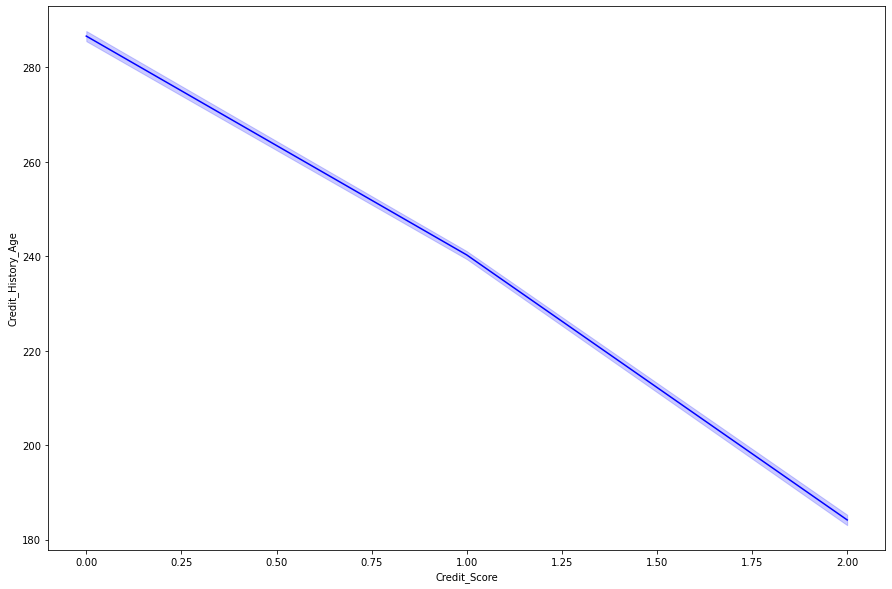

In [83]:
plt.figure(figsize=(15,10))
sns.lineplot(y="Credit_History_Age", x="Credit_Score", color="blue", data=df)
plt.show()

# Payment_of_Min_Amount

In [84]:
df.Payment_of_Min_Amount.value_counts()

Yes    42300
No     33540
NM     10310
Name: Payment_of_Min_Amount, dtype: int64

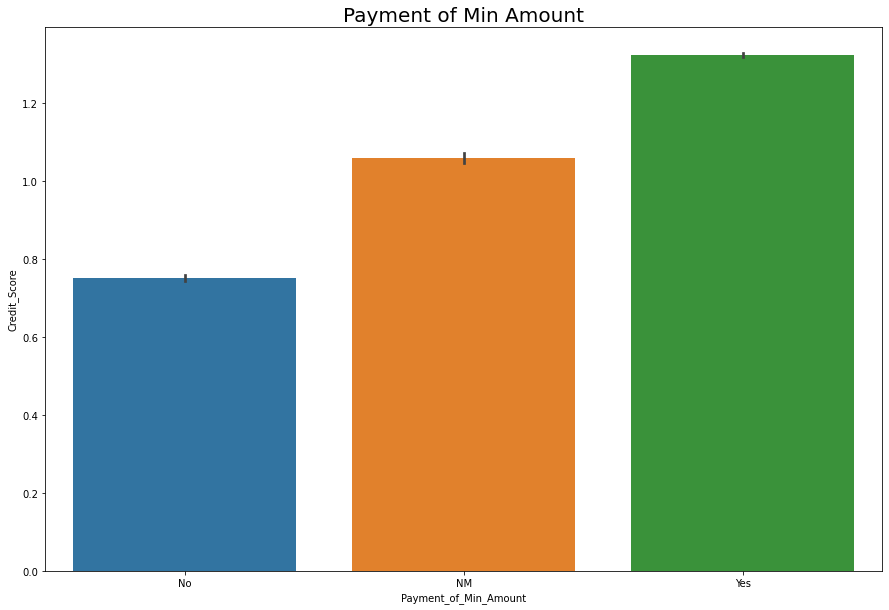

In [85]:
plt.figure(figsize=(15,10))
sns.barplot(x="Payment_of_Min_Amount", y="Credit_Score", data=df)
plt.title("Payment of Min Amount", fontsize=20)
plt.show()

In [86]:
anv_mdl =ols('Credit_Score ~ Payment_of_Min_Amount',data=df).fit()
anv_tbl = sm.stats.anova_lm(anv_mdl)
print(round(anv_tbl,5))

                            df       sum_sq     mean_sq          F  PR(>F)
Payment_of_Min_Amount      2.0   6093.62982  3046.81491  8081.0911     0.0
Residual               86147.0  32480.01547     0.37703        NaN     NaN


# Total_EMI_per_month

In [87]:
df.Total_EMI_per_month.value_counts()

0.000000       10487
49.574949          8
62.105156          8
168.184988         8
210.297875         8
               ...  
1357.000000        1
177.321862         1
337.534085         1
95.247256          1
169.855299         1
Name: Total_EMI_per_month, Length: 10325, dtype: int64

[Text(0.5, 0, '')]

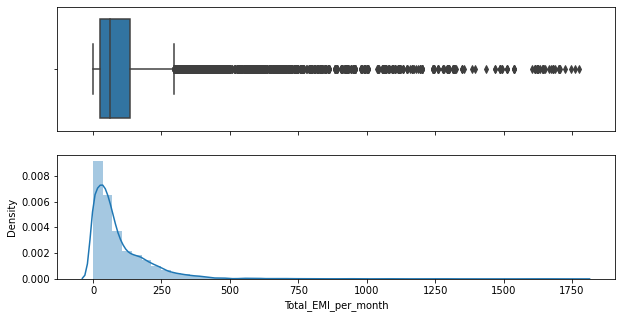

In [88]:
fig,(ax1,ax2)=plt.subplots(2,sharex=True,figsize=(10,5))
sns.boxplot(df.Total_EMI_per_month,ax=ax1)
sns.distplot(df.Total_EMI_per_month,ax=ax2)
ax1.set(xlabel='')

In [89]:

df=df[df['Total_EMI_per_month'].isin(remove_outliers(df['Total_EMI_per_month']))]

Text(0.5, 1.0, 'Boxplot of Total_EMI_per_month')

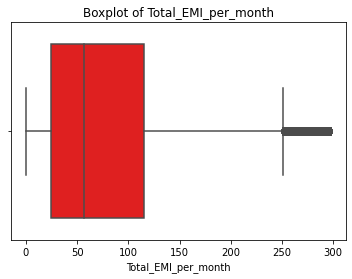

In [90]:
sns.boxplot(df.Total_EMI_per_month, color = 'red')
plt.title('Boxplot of Total_EMI_per_month')

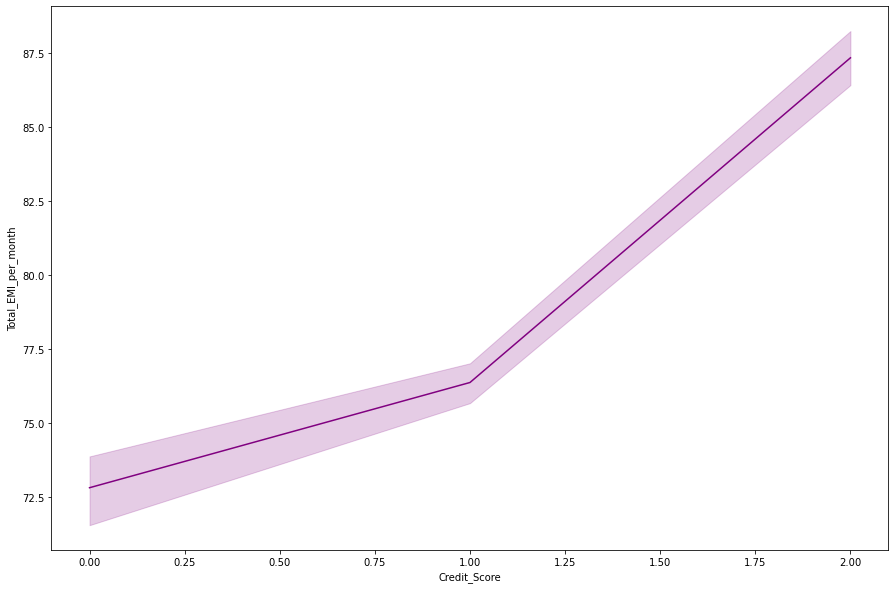

In [91]:
plt.figure(figsize=(15,10))
sns.lineplot(y="Total_EMI_per_month", x="Credit_Score", color="purple", data=df)
plt.show()

# Amount_invested_monthly

In [92]:
df.Amount_invested_monthly.value_counts()

0.000000      1379
21.465380        8
138.301360       8
55.333694        8
40.305559        8
              ... 
128.169472       1
11.060621        1
57.235943        1
24.472308        1
72.437150        1
Name: Amount_invested_monthly, Length: 10381, dtype: int64

[Text(0.5, 0, '')]

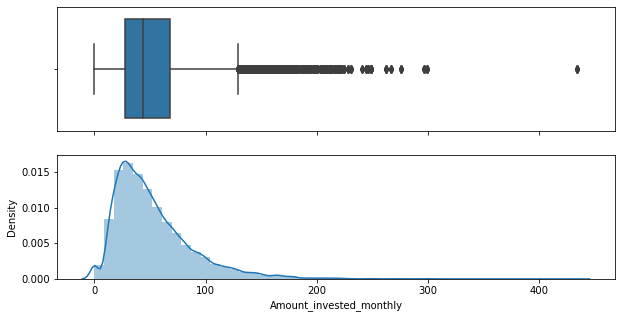

In [93]:
fig,(ax1,ax2)=plt.subplots(2,sharex=True,figsize=(10,5))
sns.boxplot(df.Amount_invested_monthly,ax=ax1)
sns.distplot(df.Amount_invested_monthly,ax=ax2)
ax1.set(xlabel='')

In [94]:
df=df[df['Amount_invested_monthly'].isin(remove_outliers(df['Amount_invested_monthly']))]

Text(0.5, 1.0, 'Boxplot of Amount_invested_monthly')

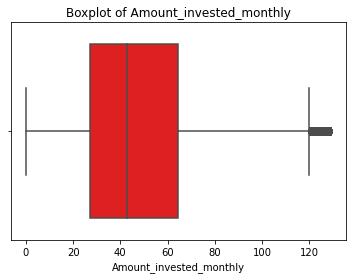

In [95]:
sns.boxplot(df.Amount_invested_monthly, color = 'red')
plt.title('Boxplot of Amount_invested_monthly')

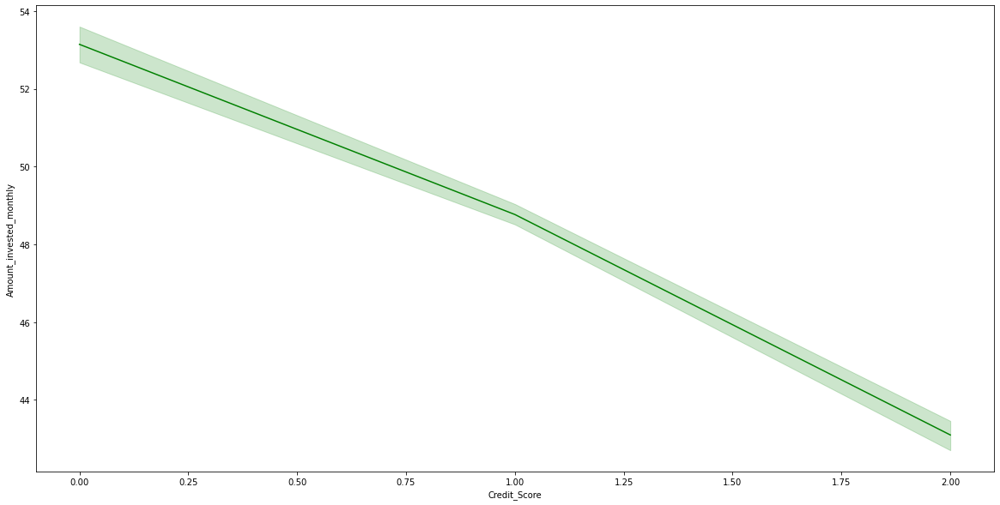

In [96]:
plt.figure(figsize=(20,10))
sns.lineplot(y="Amount_invested_monthly", x="Credit_Score", color="green", data=df)
plt.show()

# Payment_Behaviour

In [97]:
df.Payment_Behaviour.value_counts()

Low_spent_Small_value_payments      23384
High_spent_Medium_value_payments    15536
High_spent_Large_value_payments     10899
Low_spent_Medium_value_payments     10799
High_spent_Small_value_payments      9252
Low_spent_Large_value_payments       8545
Name: Payment_Behaviour, dtype: int64

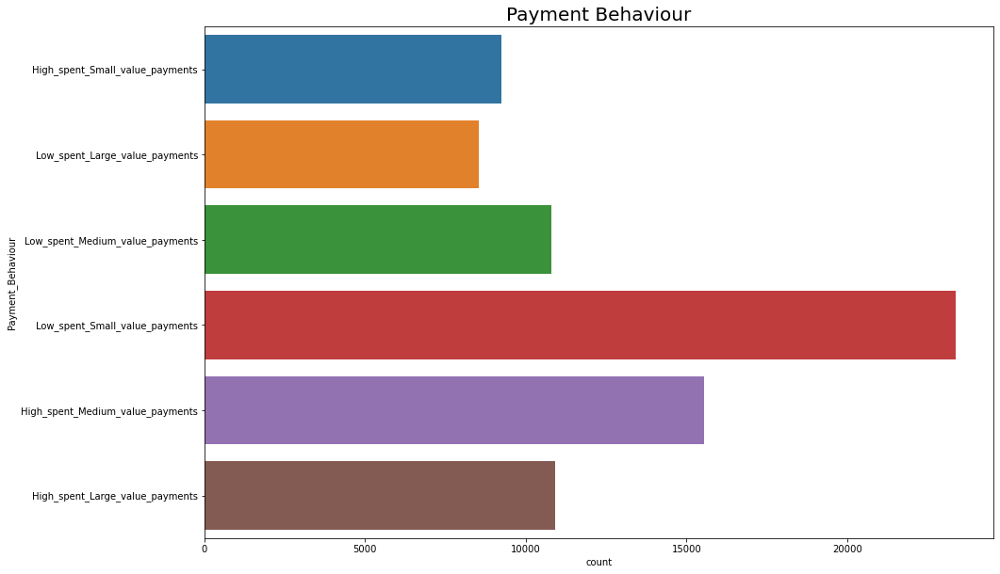

In [98]:
plt.figure(figsize=(15,10))
sns.countplot(y="Payment_Behaviour", data=df)
plt.title("Payment Behaviour", fontsize=20)
plt.show()

In [99]:
anv_mdl =ols('Credit_Score ~ Payment_Behaviour',data=df).fit()
anv_tbl = sm.stats.anova_lm(anv_mdl)
print(round(anv_tbl,5))

                        df       sum_sq   mean_sq          F  PR(>F)
Payment_Behaviour      5.0    495.13601  99.02720  227.25293     0.0
Residual           78409.0  34167.32062   0.43576        NaN     NaN


# Monthly_Balance

In [100]:
df.Monthly_Balance.value_counts()

42.892957     6
637.253298    6
263.314126    6
268.382537    6
52.952313     5
             ..
420.649991    1
361.674251    1
520.159176    1
318.970497    1
393.673696    1
Name: Monthly_Balance, Length: 77998, dtype: int64

[Text(0.5, 0, '')]

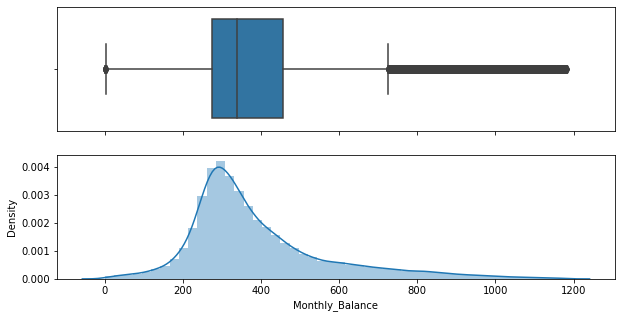

In [101]:
fig,(ax1,ax2)=plt.subplots(2,sharex=True,figsize=(10,5))
sns.boxplot(df.Monthly_Balance,ax=ax1)
sns.distplot(df.Monthly_Balance,ax=ax2)
ax1.set(xlabel='')

In [102]:
df=df[df['Monthly_Balance'].isin(remove_outliers(df['Monthly_Balance']))]

Text(0.5, 1.0, 'Boxplot of Monthly_Balance')

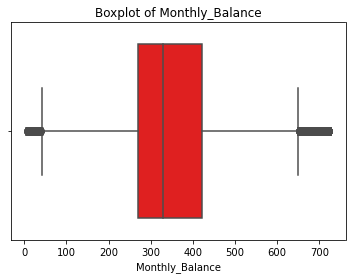

In [103]:
sns.boxplot(df.Monthly_Balance, color = 'red')
plt.title('Boxplot of Monthly_Balance')

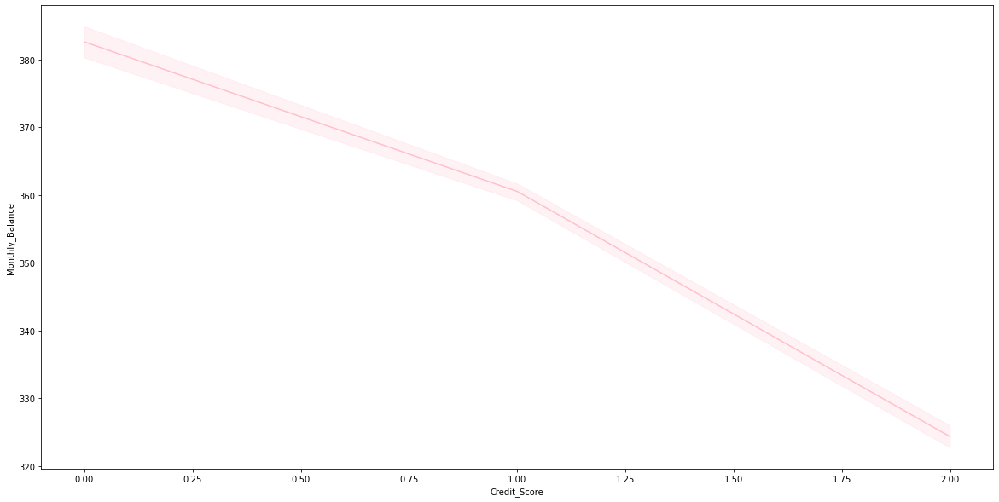

In [104]:
plt.figure(figsize=(20,10))
sns.lineplot(y="Monthly_Balance", x="Credit_Score", color="pink", data=df)
plt.show()

In [105]:
color_palette = ["#3498db", "#e74c3c", "#2ecc71"]


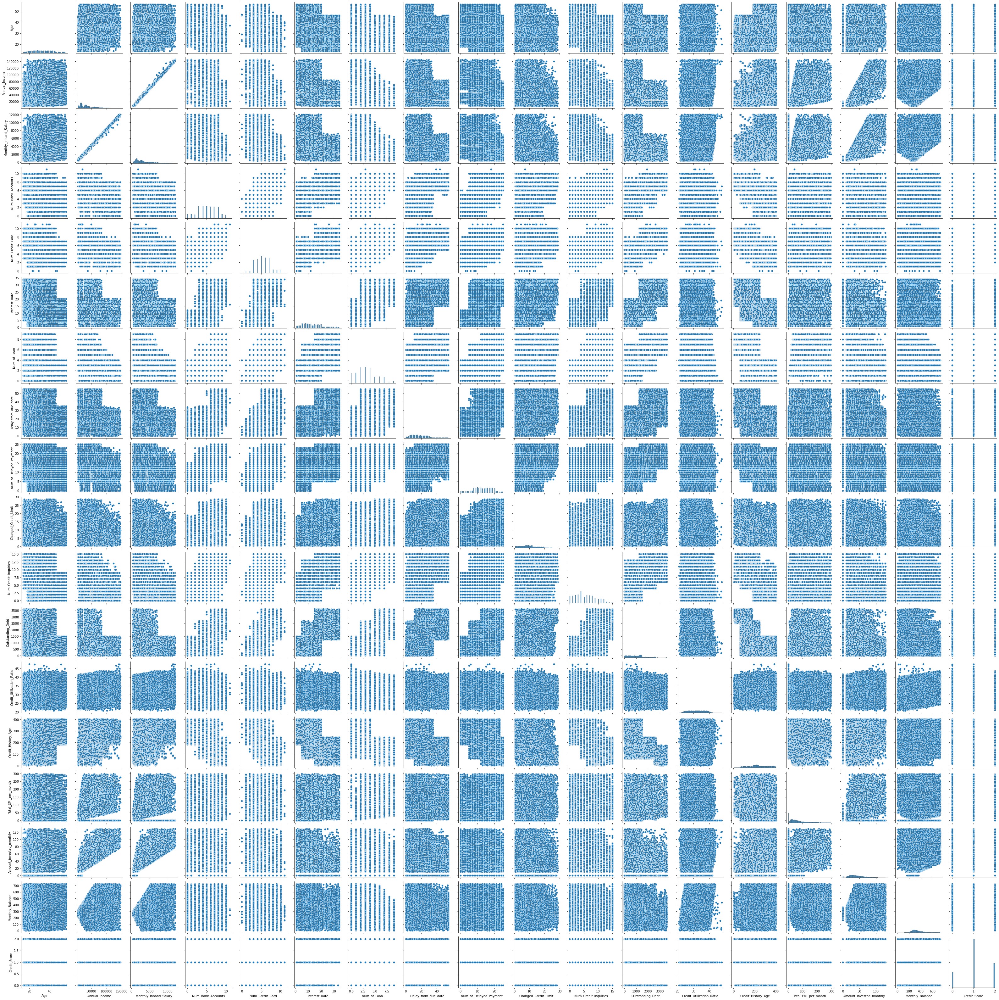

In [106]:
#sns.pairplot(data=df)
sns.pairplot(df, palette=color_palette)


# Applying One-Hot Encoding

In [107]:
df1=pd.get_dummies(df,drop_first=True)
df1.head()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,...,Credit_Score,Credit_Mix_Good,Credit_Mix_Standard,Payment_of_Min_Amount_No,Payment_of_Min_Amount_Yes,Payment_Behaviour_High_spent_Medium_value_payments,Payment_Behaviour_High_spent_Small_value_payments,Payment_Behaviour_Low_spent_Large_value_payments,Payment_Behaviour_Low_spent_Medium_value_payments,Payment_Behaviour_Low_spent_Small_value_payments
0,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,7.0,11.27,...,0,1,0,1,0,0,1,0,0,0
1,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,4.0,11.27,...,0,1,0,1,0,0,0,1,0,0
2,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,3.0,7.0,11.27,...,0,1,0,1,0,0,0,0,1,0
3,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,5.0,4.0,6.27,...,0,1,0,1,0,0,0,0,0,1
4,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,6.0,4.0,11.27,...,0,1,0,1,0,1,0,0,0,0


In [108]:
df1.shape

(72961, 27)

# VIF

In [109]:
from statsmodels.stats.outliers_influence import variance_inflation_factor


In [110]:
#Splitting Data
x=df1.drop('Credit_Score',axis=1)
y=df1['Credit_Score']

In [111]:
x.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 72961 entries, 0 to 99999
Data columns (total 26 columns):
 #   Column                                              Non-Null Count  Dtype  
---  ------                                              --------------  -----  
 0   Age                                                 72961 non-null  float64
 1   Annual_Income                                       72961 non-null  float64
 2   Monthly_Inhand_Salary                               72961 non-null  float64
 3   Num_Bank_Accounts                                   72961 non-null  float64
 4   Num_Credit_Card                                     72961 non-null  float64
 5   Interest_Rate                                       72961 non-null  float64
 6   Num_of_Loan                                         72961 non-null  float64
 7   Delay_from_due_date                                 72961 non-null  float64
 8   Num_of_Delayed_Payment                              72961 non-null  float64


In [112]:
y.info()

<class 'pandas.core.series.Series'>
Int64Index: 72961 entries, 0 to 99999
Series name: Credit_Score
Non-Null Count  Dtype
--------------  -----
72961 non-null  int64
dtypes: int64(1)
memory usage: 3.1 MB


In [113]:
vif=pd.DataFrame()
vif['features']=x.columns
vif['vif Factor']=[variance_inflation_factor(x.values,i) for i in range(x.shape[1])]
print(vif.round(decimals=5))

                                             features  vif Factor
0                                                 Age    10.95289
1                                       Annual_Income   536.14355
2                               Monthly_Inhand_Salary   532.67681
3                                   Num_Bank_Accounts    10.20618
4                                     Num_Credit_Card    11.58752
5                                       Interest_Rate     8.88362
6                                         Num_of_Loan     9.69555
7                                 Delay_from_due_date     6.21763
8                              Num_of_Delayed_Payment    10.90532
9                                Changed_Credit_Limit     5.41150
10                               Num_Credit_Inquiries     6.90005
11                                   Outstanding_Debt     6.98528
12                           Credit_Utilization_Ratio    34.69129
13                                 Credit_History_Age    12.11772
14        

In [114]:
df1.drop(['Annual_Income','Monthly_Inhand_Salary','Credit_Utilization_Ratio','Monthly_Balance'],axis=1,inplace=True)

In [115]:
df1.drop(['Num_of_Delayed_Payment','Credit_Mix_Good','Age','Num_Credit_Card','Credit_History_Age'],axis=1,inplace=True)

In [116]:
df1.drop(['Num_Bank_Accounts','Num_of_Loan','Credit_Mix_Standard'],axis=1,inplace=True)

In [117]:
df1.shape

(72961, 15)

In [118]:
df1.columns

Index(['Interest_Rate', 'Delay_from_due_date', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Credit_Score', 'Payment_of_Min_Amount_No',
       'Payment_of_Min_Amount_Yes',
       'Payment_Behaviour_High_spent_Medium_value_payments',
       'Payment_Behaviour_High_spent_Small_value_payments',
       'Payment_Behaviour_Low_spent_Large_value_payments',
       'Payment_Behaviour_Low_spent_Medium_value_payments',
       'Payment_Behaviour_Low_spent_Small_value_payments'],
      dtype='object')

# Heatmap
Correlation Analysis

Ploting a Heatmap to reduce the variable which has less correlation.

In [119]:
import seaborn as sns

In [120]:
corr=df1.corr()
           

<AxesSubplot:>

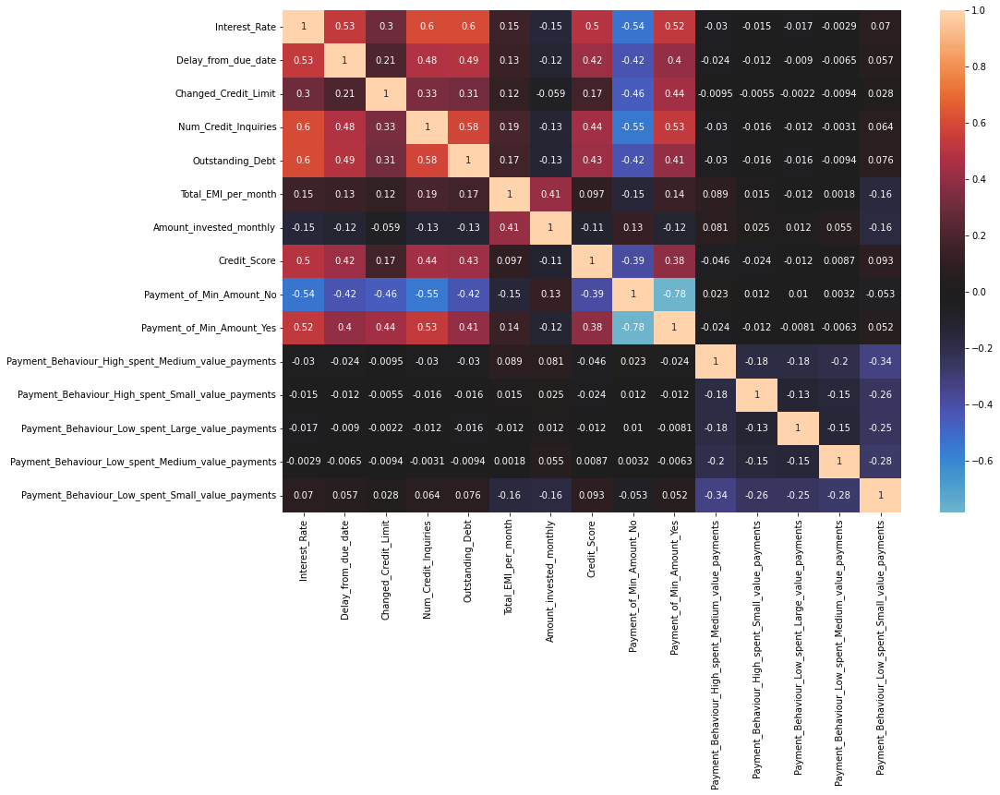

In [121]:
plt.figure(figsize=(15,10))
sns.heatmap(corr, annot=True, center=0)

In [122]:
corr_matrix = df.corr()


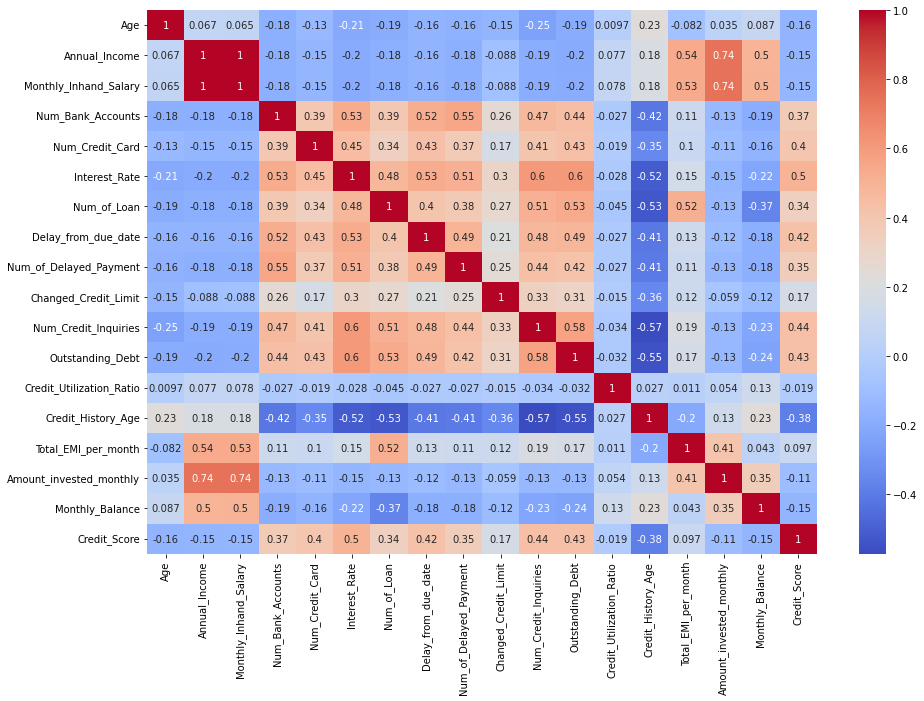

In [123]:

plt.figure(figsize=(15,10))
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True)
plt.show()

In [124]:
corr_threshold = 0.8
corr_abs = np.abs(corr_matrix)
upper = np.triu(corr_abs, 1)
to_drop = [df.columns[i] for i in range(corr_abs.shape[0]) if any(upper[i] > corr_threshold)]
data = df.drop(to_drop, axis=1)


In [125]:
print(data.columns)

Index(['Age', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts', 'Num_Credit_Card',
       'Interest_Rate', 'Num_of_Loan', 'Delay_from_due_date',
       'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score'],
      dtype='object')


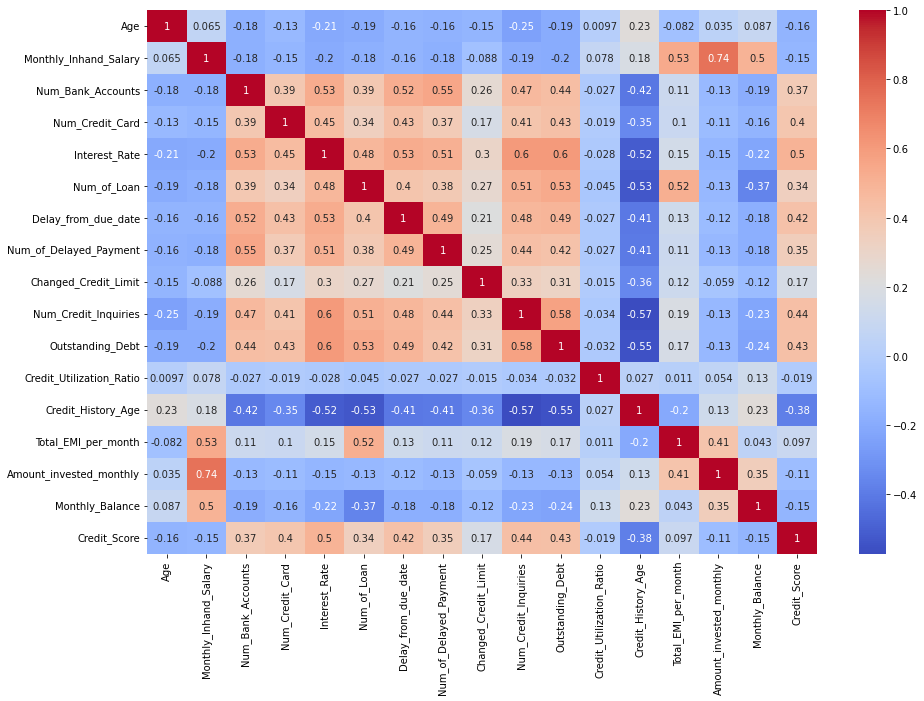

In [126]:
plt.figure(figsize=(15,10))
corr_matrix = data.corr()
sns.heatmap(corr_matrix, cmap='coolwarm', annot=True)
plt.show()

# Feature selection using ExtraTreesClassifier

In [127]:
#ExtraTreesClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.feature_selection import SelectFromModel
clf = ExtraTreesClassifier(n_estimators=100)
clf = clf.fit(x.values, y)
clf.feature_importances_  
model = SelectFromModel(clf, prefit=True)
X_new = model.transform(x.values)

In [128]:
print(X_new)

[[ 23.           4.           3.         ... 312.49408868   1.
    0.        ]
 [ 23.           4.           3.         ... 284.6291625    1.
    0.        ]
 [ 23.           4.           3.         ... 331.20986285   1.
    0.        ]
 ...
 [ 25.           6.           7.         ... 516.80908327   1.
    0.        ]
 [ 25.           6.           7.         ... 319.16497853   1.
    0.        ]
 [ 25.           6.           7.         ... 393.67369556   1.
    0.        ]]


In [129]:
X_new.shape

(72961, 13)

In [130]:
df1.shape

(72961, 15)

In [131]:
df1.columns

Index(['Interest_Rate', 'Delay_from_due_date', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Outstanding_Debt', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Credit_Score', 'Payment_of_Min_Amount_No',
       'Payment_of_Min_Amount_Yes',
       'Payment_Behaviour_High_spent_Medium_value_payments',
       'Payment_Behaviour_High_spent_Small_value_payments',
       'Payment_Behaviour_Low_spent_Large_value_payments',
       'Payment_Behaviour_Low_spent_Medium_value_payments',
       'Payment_Behaviour_Low_spent_Small_value_payments'],
      dtype='object')

# Train test 

In [132]:
from sklearn.model_selection import train_test_split

In [133]:
X_train,X_test,y_train,y_test=train_test_split(X_new,y,test_size=0.3,random_state=40)

# standard scaling

In [134]:
#standard scaling
from sklearn.preprocessing import StandardScaler

In [135]:
sc=StandardScaler()
X_train=sc.fit_transform(X_train)
X_test=sc.transform(X_test)

# Modeling

In [136]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [137]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor


In [138]:
from sklearn.metrics import r2_score,mean_squared_error

In [139]:
## create a new directory to store all the accuracy of the models

model_comparison={}

In [140]:
lr=LinearRegression()
lr.fit(X_train,y_train)

LinearRegression()

In [141]:
y_pred1=lr.predict(X_test)
r2_score_val=round(r2_score(y_test,y_pred1)*100,2)
print ('R2_score: ' ,r2_score_val)

mse=round(mean_squared_error(y_test,y_pred1),2)
print ('MSE: ' ,mse)
rmse = np.sqrt(mse)
print ('RMSE: ' ,rmse)

R2_score:  34.92
MSE:  0.29
RMSE:  0.5385164807134504


# DecisionTree

In [142]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

In [143]:
#define the parameter space for the hyperparemeters

param_grid={
           'criterion':['mse', 'friedman_mse'],
           'max_depth':randint(1,100),
           'min_samples_split':randint(1,20)}

In [144]:
#create the Randomizedsearchcv object
decireg=DecisionTreeRegressor()
random_search=RandomizedSearchCV(decireg,param_grid,cv=5,n_jobs=-1)

In [145]:
random_search.fit(X_train,y_train)
y_pred2=random_search.predict(X_test)
r2_score_val=round(r2_score(y_test,y_pred2)*100,2)
print('R2 score:',r2_score_val)
mse_dt=round(mean_squared_error(y_test,y_pred2),2)
print('mse: ',mse_dt)
rmse_dt=round(np.sqrt(mse_dt),2)
print('RMSE:',rmse_dt)

R2 score: 47.37
mse:  0.23
RMSE: 0.48


# RandomForest

In [146]:
rf = RandomForestRegressor(random_state=20)

In [147]:
# Use RandomizedSearchCV to find the best number of estimators
param_distributions = {'n_estimators': randint(10, 100)}
random_search = RandomizedSearchCV(rf, param_distributions, n_iter=10, cv=5)
random_search.fit(X_train,y_train)

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=20),
                   param_distributions={'n_estimators': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001CD8B746EB0>})

In [148]:
# Get the best number of estimators
best_n_estimators = random_search.best_params_['n_estimators']

In [149]:
# Train the random forest model with the best number of estimators
rf = RandomForestRegressor(n_estimators=best_n_estimators, random_state=42)
rf.fit(X_train,y_train)

RandomForestRegressor(n_estimators=97, random_state=42)

In [150]:
y_pred3=rf.predict(X_test)
r2_score_val=round(r2_score(y_test,y_pred3)*100,2)
print('R2 score:',r2_score_val)
mse=round(mean_squared_error(y_test,y_pred3),2)
print('MSE: ',mse)
rmse=round(np.sqrt(mse),2)
print('RMSE:',rmse)

R2 score: 65.16
MSE:  0.16
RMSE: 0.4


# KNN

In [151]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score


In [152]:
KNN = KNeighborsClassifier(n_neighbors=3)

In [153]:
KNN.fit(X_train, y_train)


KNeighborsClassifier(n_neighbors=3)

In [154]:
y_pred4=KNN.predict(X_test)
r2_score_val=round(r2_score(y_test,y_pred4)*100,2)
print('R2 score:',r2_score_val)
mse=round(mean_squared_error(y_test,y_pred4),2)
print('MSE: ',mse)
rmse=round(np.sqrt(mse),2)
print('RMSE:',rmse)

R2 score: 26.74
MSE:  0.33
RMSE: 0.57


# SVM

In [155]:
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

In [156]:
SVM = SVC(kernel='linear')

In [157]:
SVM.fit(X_train,y_train)


SVC(kernel='linear')

In [158]:
y_pred5=SVM.predict(X_test)
r2_score_val=round(r2_score(y_test,y_pred5)*100,2)
print('R2 score:',r2_score_val)
mse=round(mean_squared_error(y_test,y_pred5),2)
print('MSE: ',mse)
rmse=round(np.sqrt(mse),2)
print('RMSE:',rmse)

R2 score: -2.55
MSE:  0.46
RMSE: 0.68


# Durbin Watson
Autocorrelation

In [159]:
import numpy as np
from statsmodels.stats.stattools import durbin_watson

In [160]:
print(df1.dtypes)

Interest_Rate                                         float64
Delay_from_due_date                                   float64
Changed_Credit_Limit                                  float64
Num_Credit_Inquiries                                  float64
Outstanding_Debt                                      float64
Total_EMI_per_month                                   float64
Amount_invested_monthly                               float64
Credit_Score                                            int64
Payment_of_Min_Amount_No                                uint8
Payment_of_Min_Amount_Yes                               uint8
Payment_Behaviour_High_spent_Medium_value_payments      uint8
Payment_Behaviour_High_spent_Small_value_payments       uint8
Payment_Behaviour_Low_spent_Large_value_payments        uint8
Payment_Behaviour_Low_spent_Medium_value_payments       uint8
Payment_Behaviour_Low_spent_Small_value_payments        uint8
dtype: object


In [161]:
Data = durbin_watson(df1)


In [162]:
print(Data)

[0.07530808 0.0974827  0.11210612 0.10983723 0.0910656  0.14174511
 0.07651101 0.16149934 0.38837053 0.34015605 1.47426913 1.72609037
 1.74336283 1.63434903 1.21198849]
